## Import all packages here

In [1]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
import torchvision.models as models
import cv2
from torchvision import transforms
from PIL import Image
from pathlib import Path

## Define our model here

In [26]:
class SpatialAttentionModule(nn.Module):
    def __init__(self, kernel_size=7):
        super(SpatialAttentionModule, self).__init__()
        # we reduce 256 channels to 1
        self.conv1 = nn.Conv2d(256, 1, kernel_size=kernel_size, padding=kernel_size//2, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        # Generate attention map
        attention = self.conv1(x)  
        # Apply sigmoid to normalize
        attention = self.sigmoid(attention)  
        # emphasize & diminish through matrix mult
        return x * attention


class Soccer_CNN(nn.Module):
    def __init__(self, num_classes):
        super(Soccer_CNN, self).__init__()

        self.conv1 = nn.Conv2d(3, 96, kernel_size=7, stride=2)
        self.conv2 =  nn.Conv2d(96, 256, kernel_size=5, stride=2)
        self.conv3 =  nn.Conv2d(256, 384, kernel_size=3, stride=1)
        self.conv4 =  nn.Conv2d(384, 384, kernel_size=3, stride=1)
        self.conv5 =  nn.Conv2d(384, 256, kernel_size=3, stride=1)
        self.max_pool = nn.MaxPool2d(3, stride=2)
        self.fc1 = nn.Linear(1024, 512)
        self.fc2 = nn.Linear(512, 512)
        self.output = nn.Linear(512, num_classes)
        # the value increased to 0.6 because I found out the model is easily overfit
        self.dropout = nn.Dropout(p=0.6)
        #self.spatial_attention = SpatialAttentionModule()
        
    def forward(self, x):
        
        # Layer 1
        x = self.max_pool(F.relu(self.conv1(x)))
        # Layer 2
        x = self.max_pool(F.relu(self.conv2(x)))
        # Layer 3
        x = F.relu(self.conv3(x))
        # Layer 4
        x = F.relu(self.conv4(x))
        # Layer 5
        x = self.max_pool(F.relu(self.conv5(x)))

        # Apply spatial attention
        # when train the normal model, this needs to be comment out
        #x = self.spatial_attention(x)
        
        # Layer 6
        x = torch.flatten(x, 1)
        x = self.dropout(F.relu(self.fc1(x)))
        # Layer 7
        x = self.dropout(F.relu(self.fc2(x)))
        # Layer 8
        #pred = F.softmax(self.output(x), dim=1)
        pred = self.output(x)
        return pred


## Read Data and Split to Train/Test set

In [27]:

# Paths to the training data
clean_folder = Path('tackle_data/var600/VAR/Clean_Tackles')
clean_paths = list(clean_folder.glob('*.jpg'))

foul_folder = Path('tackle_data/var600/VAR/Fouls')
foul_paths = list(foul_folder.glob('*.jpg'))


# As what the paper suggests, we apply the same transformations
preprocess = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# List to hold the tensors
image_tensors = []

#  preprocess the image one by one
for image_path in clean_paths:
    # Read the image file
    image = cv2.imread(str(image_path))
    
    # Convert the image from BGR to RGB
    # we need this before convert it to tensor
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Apply the preprocessing transformations
    image_tensor = preprocess(image)
    
    image_tensors.append(image_tensor)

# generate labels for no foul data
labels = [torch.tensor([0]) for i in range(len(image_tensors))]


for image_path in foul_paths:
    # Read the image file
    image = cv2.imread(str(image_path))

    # Convert the image from BGR to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Apply the preprocessing transformations
    image_tensor = preprocess(image)
    
    image_tensors.append(image_tensor)

# generate labels for foul data
labels.extend([torch.tensor([1]) for i in range(len(image_tensors) - len(labels))])

In [28]:
import random

# ensure we get the same order of data even after shuffle
random.seed(42)

# Create a list of tuples pairing each tensor with its corresponding label
sequences = [(tensor, label) for tensor, label in zip(image_tensors, labels)]

# Shuffle the sequences to ensure the training and testing data are randomly distributed
# this is neccessary because our data is imbalance
random.shuffle(sequences)

# split the data
split_ratio = 0.8

split_index = int(split_ratio * len(sequences))

train_sequences = sequences[:split_index]
test_sequences = sequences[split_index:]

# The size of train data and test data
print(f'Training data size: {len(train_sequences)}')
print(f'Testing data size: {len(test_sequences)}')


Training data size: 2321
Testing data size: 581


## Train the Model here

Epoch [1/50], Loss: 0.5863, Accuracy: 0.7592
Epoch [2/50], Loss: 0.5424, Accuracy: 0.7596
Epoch [3/50], Loss: 0.5092, Accuracy: 0.7596
Epoch [4/50], Loss: 0.4788, Accuracy: 0.7592
Epoch [5/50], Loss: 0.4602, Accuracy: 0.7583
Epoch [6/50], Loss: 0.4443, Accuracy: 0.7544
Epoch [7/50], Loss: 0.4318, Accuracy: 0.7596
Epoch [8/50], Loss: 0.4248, Accuracy: 0.7561
Epoch [9/50], Loss: 0.4186, Accuracy: 0.7544
Epoch [10/50], Loss: 0.4120, Accuracy: 0.7579
Epoch [11/50], Loss: 0.4059, Accuracy: 0.7518
Epoch [12/50], Loss: 0.3940, Accuracy: 0.7587
Epoch [13/50], Loss: 0.3906, Accuracy: 0.7566
Epoch [14/50], Loss: 0.3812, Accuracy: 0.7652
Epoch [15/50], Loss: 0.3820, Accuracy: 0.7665
Epoch [16/50], Loss: 0.3751, Accuracy: 0.7622
Epoch [17/50], Loss: 0.3723, Accuracy: 0.7734
Epoch [18/50], Loss: 0.3670, Accuracy: 0.7794
Epoch [19/50], Loss: 0.3616, Accuracy: 0.7966
Epoch [20/50], Loss: 0.3553, Accuracy: 0.7941
Epoch [21/50], Loss: 0.3504, Accuracy: 0.7953
Epoch [22/50], Loss: 0.3477, Accuracy: 0.79

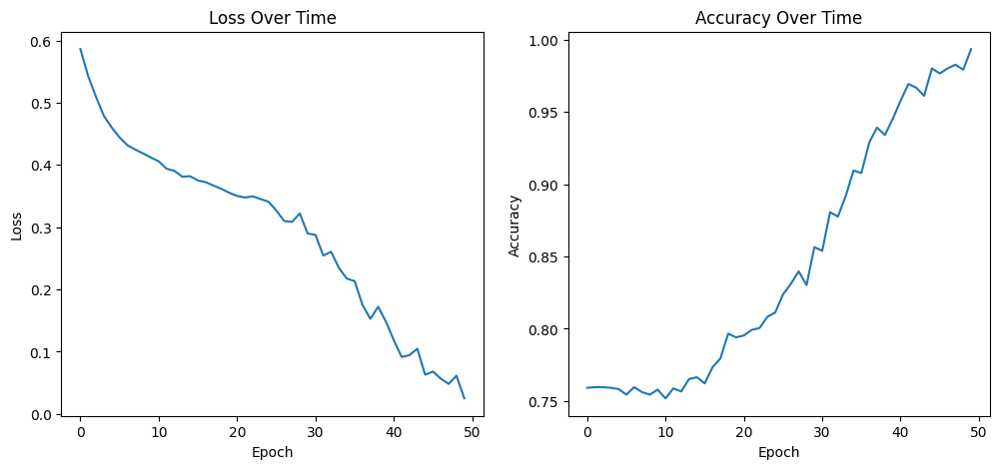

In [29]:
# use cuda to accelerate 
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# build the model and loss function
model = Soccer_CNN(num_classes=2).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.0001, momentum=0.9)

# we train the model for 50 epochs to ensure it is not overfitting
num_epochs = 50
num_data = len(train_sequences)

loss_lst = []
accuracy_lst = []

# train the model
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct_predictions = 0
    total_predictions = 0

    for seq in train_sequences:
        # send the data to GPU
        image_tensor = seq[0].unsqueeze(0).to(device)
        label = seq[1].to(device)

        optimizer.zero_grad()

        # Forward pass
        outputs = model(image_tensor)
        loss = criterion(outputs, label)

        # Backward and optimize
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        # Calculate accuracy
        _, predicted = torch.max(outputs.data, 1)
        total_predictions += label.size(0)
        correct_predictions += (predicted == label).sum().item()

    # At the end of epoch, calculate average loss and accuracy
    epoch_loss = running_loss / num_data
    epoch_accuracy = correct_predictions / total_predictions

    loss_lst.append(epoch_loss)
    accuracy_lst.append(epoch_accuracy)

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}, Accuracy: {epoch_accuracy:.4f}')

print('Finished Training')

# Plotting
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(num_epochs), loss_lst)
plt.title("Loss Over Time")
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.subplot(1, 2, 2)
plt.plot(range(num_epochs), accuracy_lst)
plt.title("Accuracy Over Time")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")

plt.show()

## Test the Performance of Model with Test Set

In [19]:
def tensor_to_image(tensor):
    """Turn a tensor to image"""
    # Undo the normalization
    mean = torch.tensor([0.485, 0.456, 0.406])
    std = torch.tensor([0.229, 0.224, 0.225])
    
    # Move the tensor to CPU if it's on GPU
    tensor = tensor.clone().detach().cpu()
    
    # If it's a batch of images, select the image at index 0
    if tensor.ndim == 4:
        tensor = tensor[0]
    
    # Undo the normalization
    tensor.mul_(std[:, None, None]).add_(mean[:, None, None])
    
    # Clamp the values in the tensor to be between 0 and 1
    tensor = torch.clamp(tensor, 0, 1)
    
    # Convert to a PIL image
    image = transforms.ToPILImage()(tensor)
    
    return image

In [30]:
model.eval()

correct_predictions = 0
total_samples = 0

with torch.no_grad():
    for seq in test_sequences:
        tensor = seq[0].unsqueeze(0).to(device)
        label = seq[1].to(device) 

        # Forward pass
        outputs = model(tensor)

        # Convert logits to predicted class
        _, predicted = torch.max(outputs, 1)

        # get performance data
        total_samples += label.size(0)

        correct_predictions += (predicted == label).sum().item()



# Calculate accuracy
accuracy = correct_predictions / total_samples * 100
print(f'Accuracy on the test set: {accuracy:.2f}%')


Accuracy on the test set: 82.10%


## Hands on example here

In [53]:
# path to get custom video for analyze
no_cards_video_folder = Path('Train_Data/No_Cards')

no_cards_video_paths = list(no_cards_video_folder.glob('*.mp4'))


# preprocess
resize_dim = (224, 224)
preprocess = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize(resize_dim),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# we exract the videos into frames
# here we skip for every ten frames to ensure the notebook have enough memory to show all the output
def process_video(video_path, frame_skip=10):
    cap = cv2.VideoCapture(str(video_path))
    frames = []
    try:
        i = 0
        while True:
            ret, frame = cap.read()
            if not ret:
                break
            if i % frame_skip == 0:
                # Convert BGR to RGB
                frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)  
                tensor = preprocess(frame).to(device)
                frames.append(tensor)
            i += 1
    finally:
        cap.release()
    return torch.stack(frames)
    
# We store the frames in a dictionary so that if the path contains many videos
# we can still analyze
video_frames = [process_video(video_path) for video_path in no_cards_video_paths]

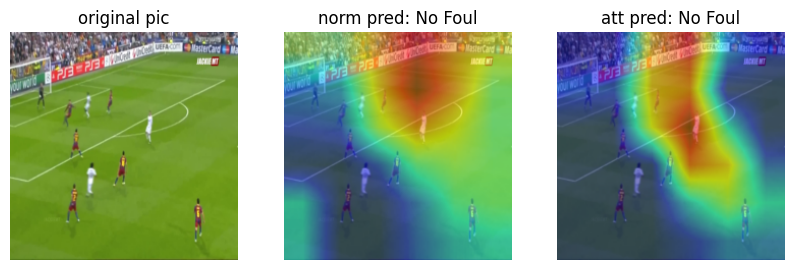

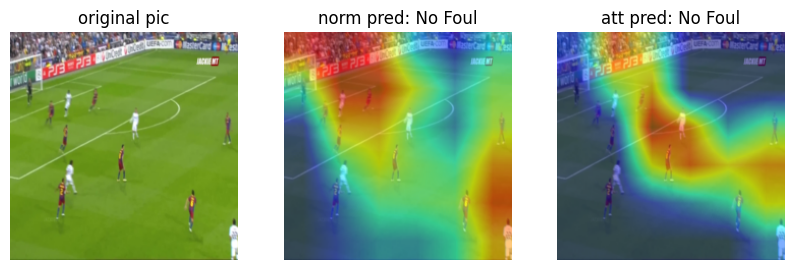

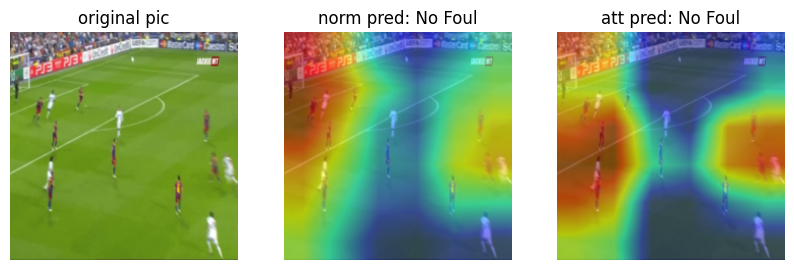

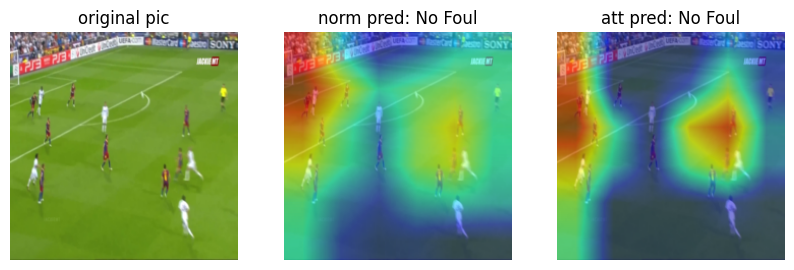

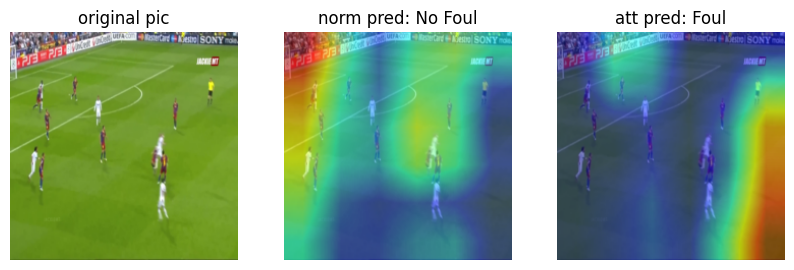

...

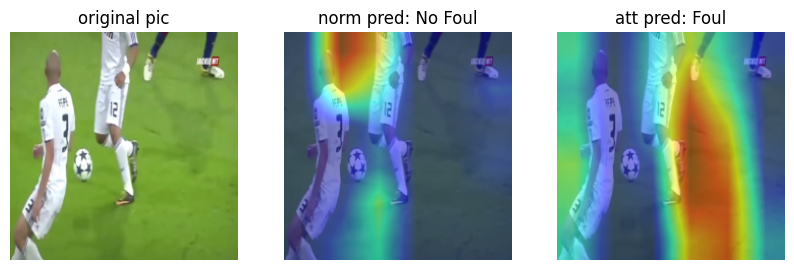

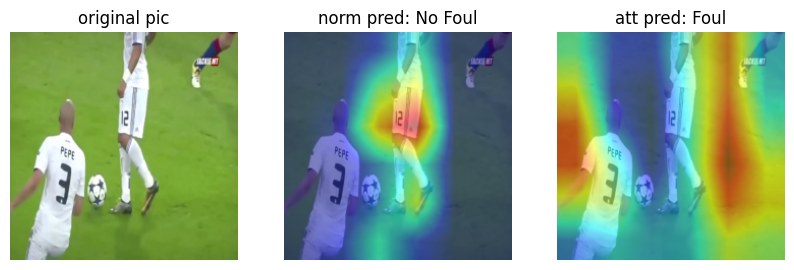

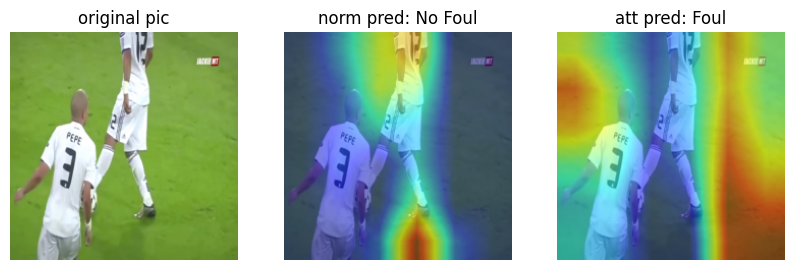

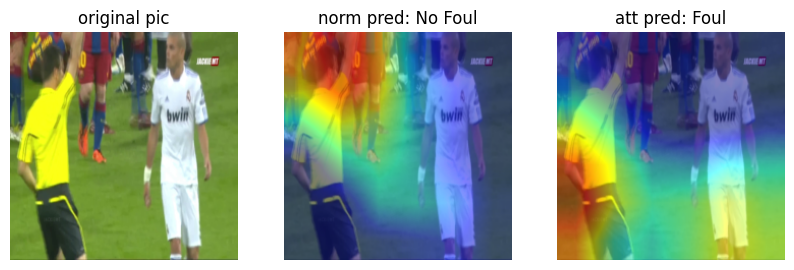

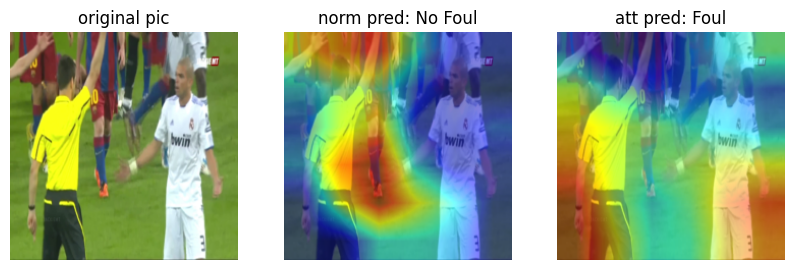

In [54]:
# load the pretrain model
att_model = torch.load('foul_detector_with_attention.pth')
normal_model = torch.load('foul_detector_without_attention.pth')

att_target_layers = [att_model.conv5] 
nor_target_layers = [normal_model.conv5] 

# Construct the CAM object once, and then re-use it on many images:
att_cam = GradCAM(model=att_model, target_layers=att_target_layers)
nor_cam = GradCAM(model=normal_model, target_layers=nor_target_layers)

classes = ['No Foul', 'Foul']

# set the model to evaluation mode
att_model.eval()
normal_model.eval()

for frames in video_frames:
    for frame in frames:
        # Ensure tensor is on the same device as the model
        input_tensor = frame.unsqueeze(0).to(device) 

        nor_pred = normal_model(input_tensor).argmax(dim=1)
        att_pred = att_model(input_tensor).argmax(dim=1)
        
        nor_targets = [ClassifierOutputTarget(nor_pred)]
        att_targets = [ClassifierOutputTarget(att_pred)]
        
        nor_grayscale_cam = nor_cam(input_tensor=input_tensor, targets=nor_targets) 
        # Reshape the CAM output to fit image dimensions
        nor_grayscale_cam = nor_grayscale_cam[0, :] 

        att_grayscale_cam = att_cam(input_tensor=input_tensor, targets=att_targets)
        # Reshape the CAM output to fit image dimensions
        att_grayscale_cam = att_grayscale_cam[0, :]  

        rgb_img = tensor_to_image(input_tensor)
        rgb_img = np.float32(rgb_img) / 255

        # the image we can use matplotlib to show
        nor_visualization = show_cam_on_image(rgb_img, nor_grayscale_cam, use_rgb=True)
        att_visualization = show_cam_on_image(rgb_img, att_grayscale_cam, use_rgb=True)

        plt.rcParams["figure.figsize"] = (10,10)
        plt.subplot(1, 3, 1)
        plt.imshow(rgb_img)
        plt.title("original pic")
        plt.axis('off')
        
        plt.subplot(1, 3, 2)
        plt.imshow(nor_visualization)
        plt.title(f"norm pred: {classes[nor_pred]}")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(att_visualization)
        plt.title(f"att pred: {classes[att_pred]}")
        plt.axis('off')

        #plt.subplots_adjust(wspace=0.5) 
        plt.show()

        

## FRAME EXTRATOR
### Use this to get train data much much faster!
### Input is the UEFA videos

In [ ]:

# Path that stores the video needs to be break down
no_cards_video_folder = Path('Train_Data/Video')

# Define the path to store the frames
frames_folder = Path('Train_Data/frames') 
frames_folder.mkdir(exist_ok=True)

# Use glob to get a list of video paths
no_cards_video_paths = list(no_cards_video_folder.glob('*.mp4'))


# you can find similar code above, it is only for getting the data, so that you don't need to run previous code for it.
# preprocess
resize_dim = (224, 224)
preprocess = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize(resize_dim),
])

# Extract the video to frames
# and save them into jpg format in a target folder
def process_video(video_path, frame_skip=10):
    cap = cv2.VideoCapture(str(video_path))
    frames = []
    try:
        i = 0
        while True:
            ret, frame = cap.read()
            if not ret:
                break
            if i % frame_skip == 0:
                frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB) 
                pil_img = preprocess(frame)  # Apply preprocessing
                frame_filename = f"{video_path.stem}_frame_{i}.jpg"
                pil_img.save(frames_folder / frame_filename)
            i += 1
    finally:
        cap.release()
    
# Process videos and save frames
for video_path in no_cards_video_paths:
    process_video(video_path)